In [1]:
import os

DATA_PATH = "../Data/"
os.path.exists(DATA_PATH)

True

In [2]:
import numpy as np
import torch
import torchvision.transforms as T
from matplotlib import pyplot as plt
from torchvision.utils import make_grid

# Using gpu if possible
dtype = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.FloatTensor

device = torch.device('cuda') if torch.cuda.is_available else torch.device('cpu')
device

device(type='cuda')

In [3]:
normalization_stats = (.5, .5, .5), (.5, .5, .5)
batch_size = 64
image_size = 64

In [4]:
transform_ds = T.Compose([
    T.Resize((image_size)),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*normalization_stats)
])

from torchvision import datasets

dataset = datasets.ImageFolder(root=DATA_PATH,transform=transform_ds)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

In [5]:
def denormalize(images):
  return images * normalization_stats[1][0] + normalization_stats[0][0]

def show_images(images, num_show=batch_size, nrow=8):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denormalize(images.detach()[:num_show]), nrow=nrow).permute(1,2,0))

def display_batch(data_loader):
  for images, _ in data_loader:
    show_images(images)
    break

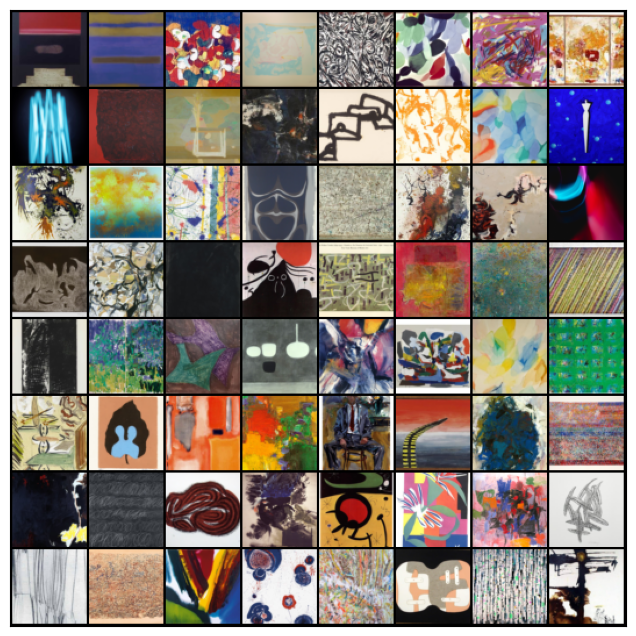

In [6]:
# Example images from this dataset
display_batch(dataloader)

In [7]:
import torch.nn as nn
import torch.nn.functional as F

Discriminator & Generator architecture inspired from a combination of:
1. LSGAN paper: https://arxiv.org/pdf/1611.04076.pdf
2. InfoGAN which explores different GAN architectures: https://arxiv.org/pdf/1606.03657.pdf

In [8]:
# Discriminator
discriminator = nn.Sequential(
    # input size: 3 x 64 x 64

    nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    # output size: 64 x 32 x 32
    
    nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2),
    # output size: 128 x 16 x 16
    
    nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2),
    # output size: 256 x 8 x 8
    
    nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2),
    # output size: 512 x 4 x 4
    
    nn.Flatten(),
    nn.Linear(8192, 1)
)

In [9]:
noise_dim = 128

In [10]:
# Generator
generator = nn.Sequential(
    # input size: noise_dim (128) x 1 x 1

    nn.ConvTranspose2d(noise_dim, out_channels=512, kernel_size=4, stride=1, padding=0),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # output size: 512 x 4 x 4
    
    nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # output size: 256 x 8 x 8
    
    nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # output size: 128 x 16 x 16
    
    nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # output size: 64 x 32 x 32
    
    nn.ConvTranspose2d(in_channels=64, out_channels=3, kernel_size=4, stride=2, padding=1),
    nn.Tanh()
    # output size: 3 x 64 x 64
)

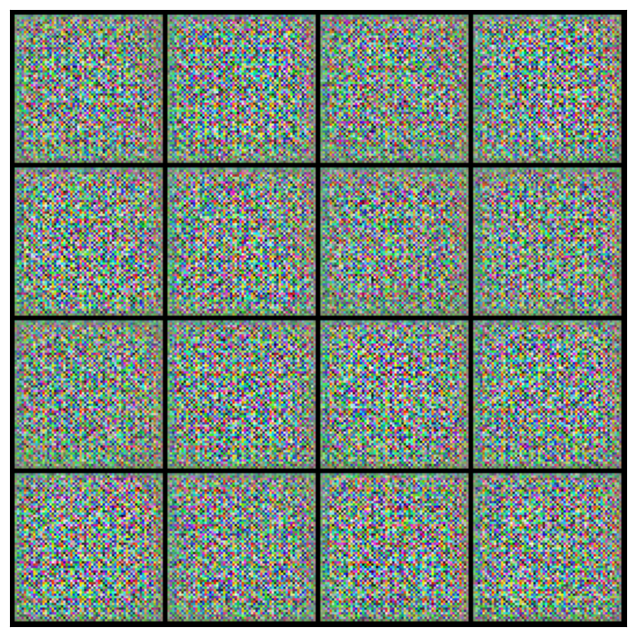

In [11]:
# Testing generator & visualizing noise
noise = torch.randn(batch_size, noise_dim, 1, 1)
fake_images = generator(noise)
show_images(fake_images, 16, 4)

In [12]:
discriminator = discriminator.type(dtype)
generator = generator.type(dtype)

# Defining loss (LSGAN)
get_loss = nn.MSELoss()

# Optimizers
dis_opt = torch.optim.Adam(discriminator.parameters(), lr = 0.0002, betas = (0.5, 0.999))
gen_opt = torch.optim.Adam(generator.parameters(), lr = 0.0002, betas = (0.5, 0.999))

In [13]:
num_epochs = 500
show_every = 50

In [14]:
epoch_images = []
epoch_loss_dis = []
epoch_loss_gen = []
epoch_count = 0

for epoch in range(num_epochs):
    for x, _ in dataloader:
        if len(x) != batch_size:
          continue
        
        # Clear discriminator gradients
        dis_opt.zero_grad()

        # Pass real data through discriminator
        real_data = x.type(dtype)
        real_logits = discriminator(real_data).squeeze().type(dtype)
        real_targets = torch.ones_like(real_logits).type(dtype)
        real_loss = get_loss(real_logits, real_targets).type(dtype)

        # Generating fake images
        noise = torch.randn(batch_size, noise_dim, 1, 1).type(dtype)
        fake_images = generator(noise).type(dtype)

        # Pass fake data through discriminator
        fake_logits = discriminator(fake_images).squeeze().type(dtype)
        fake_targets = torch.zeros_like(fake_logits).type(dtype)
        fake_loss = get_loss(fake_logits, fake_targets).type(dtype)
        d_total_loss = real_loss + fake_loss

        # Updating discriminator weights
        d_total_loss.backward()
        dis_opt.step()

        # Clear generator gradients
        gen_opt.zero_grad()

        # Generate fake images
        noise = torch.randn(batch_size, noise_dim, 1, 1).type(dtype)
        fake_images = generator(noise).type(dtype)

        # Generator loss is based on tricking the discriminator
        logits = discriminator(fake_images).squeeze().type(dtype)
        targets = torch.ones_like(logits).type(dtype)
        gen_loss = get_loss(logits, targets).type(dtype)

        # Updating generator weights
        gen_loss.backward()
        gen_opt.step()

    # Storing results
    epoch_loss_dis.append(d_total_loss.item())
    epoch_loss_gen.append(gen_loss.item())

    print('Epoch: {}, D: {:.4}, G:{:.4}'.format(epoch_count, d_total_loss.item(), gen_loss.item()))
    if epoch_count % show_every == 0:
      epoch_images.append(fake_images.cpu())

    epoch_count += 1

Epoch: 0, D: 4.307, G:5.015
Epoch: 1, D: 0.04437, G:1.403
Epoch: 2, D: 0.04252, G:1.445
Epoch: 3, D: 0.07872, G:1.873
Epoch: 4, D: 0.4341, G:0.6168
Epoch: 5, D: 0.09632, G:0.9117
Epoch: 6, D: 0.1036, G:1.176
Epoch: 7, D: 0.1206, G:1.261
Epoch: 8, D: 0.04429, G:0.9353
Epoch: 9, D: 0.08886, G:1.138
Epoch: 10, D: 0.1942, G:0.5377
Epoch: 11, D: 0.2697, G:1.305
Epoch: 12, D: 0.2078, G:0.3762
Epoch: 13, D: 0.2733, G:0.8437
Epoch: 14, D: 0.504, G:2.302
Epoch: 15, D: 0.2163, G:0.6407
Epoch: 16, D: 0.4461, G:2.339
Epoch: 17, D: 0.235, G:1.226
Epoch: 18, D: 0.1596, G:0.9256
Epoch: 19, D: 0.3327, G:0.6357
Epoch: 20, D: 0.3803, G:1.391
Epoch: 21, D: 0.09053, G:1.087
Epoch: 22, D: 0.1915, G:1.96
Epoch: 23, D: 0.1057, G:2.018
Epoch: 24, D: 0.6148, G:0.04263
Epoch: 25, D: 0.2304, G:1.952
Epoch: 26, D: 0.5458, G:2.181
Epoch: 27, D: 0.0908, G:1.04
Epoch: 28, D: 0.1552, G:0.8239
Epoch: 29, D: 0.1379, G:0.4183
Epoch: 30, D: 0.3268, G:0.4455
Epoch: 31, D: 0.3595, G:0.4681
Epoch: 32, D: 0.3965, G:0.2852
Ep

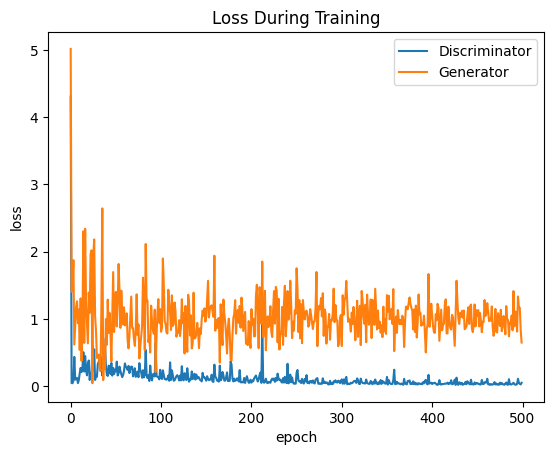

In [15]:
# Plotting losses over epochs
plt.plot(epoch_loss_dis, '-')
plt.plot(epoch_loss_gen, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Loss During Training');

Epoch: 0


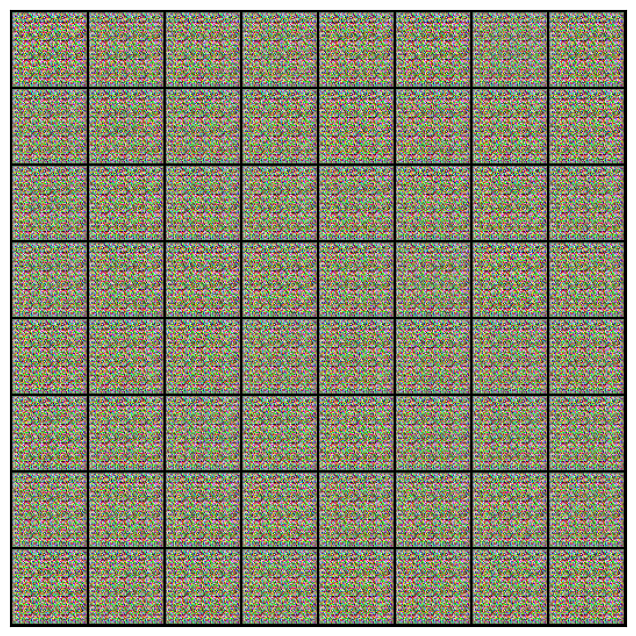


Epoch: 50


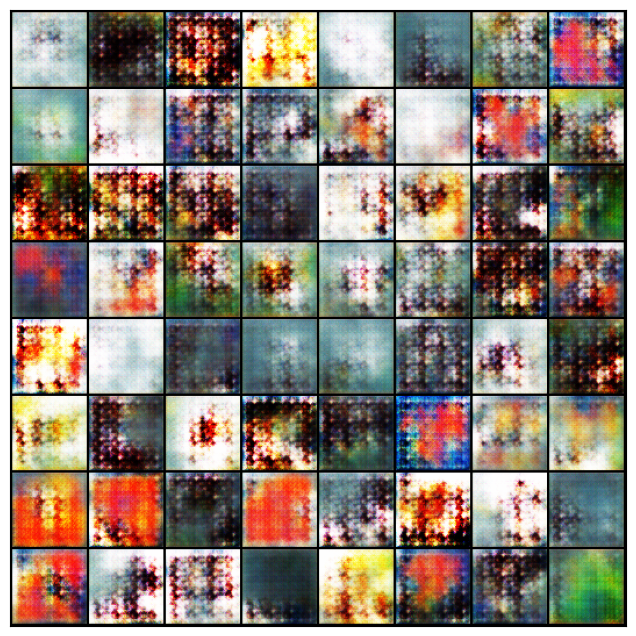


Epoch: 100


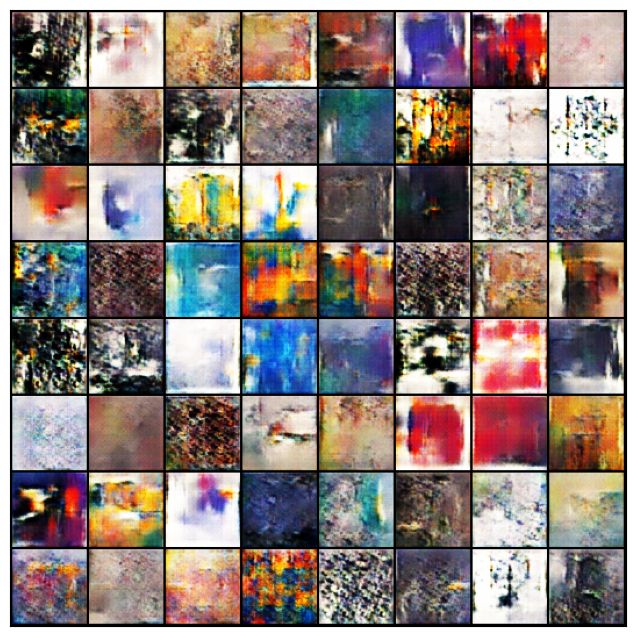


Epoch: 150


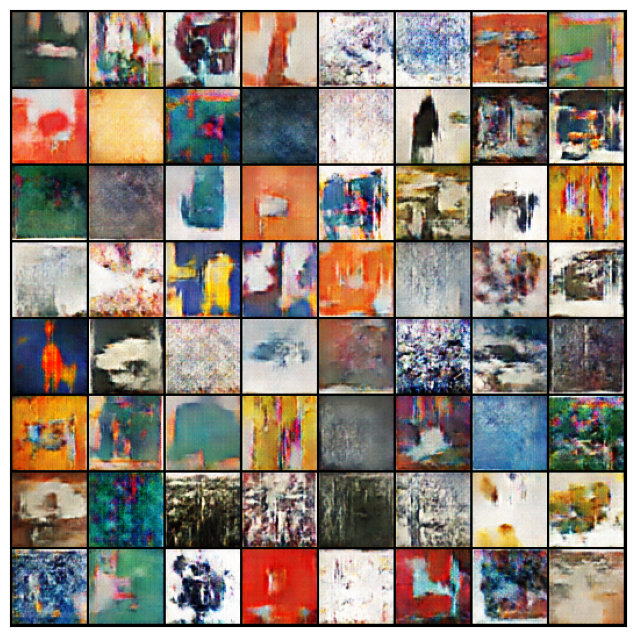


Epoch: 200


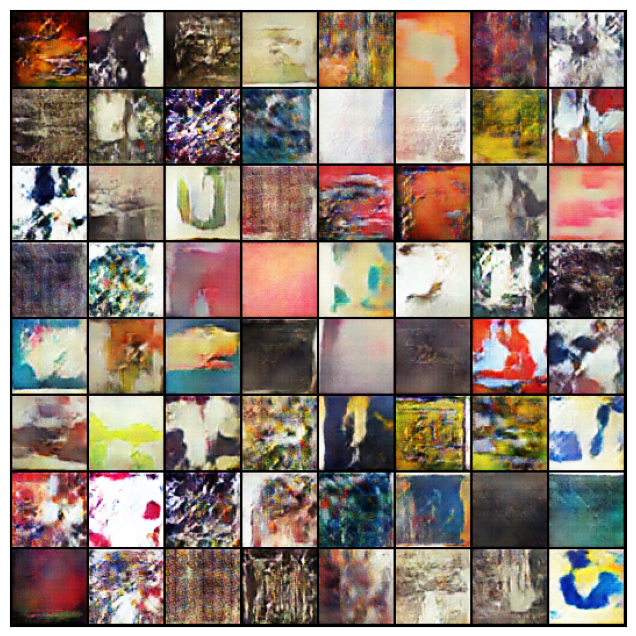


Epoch: 250


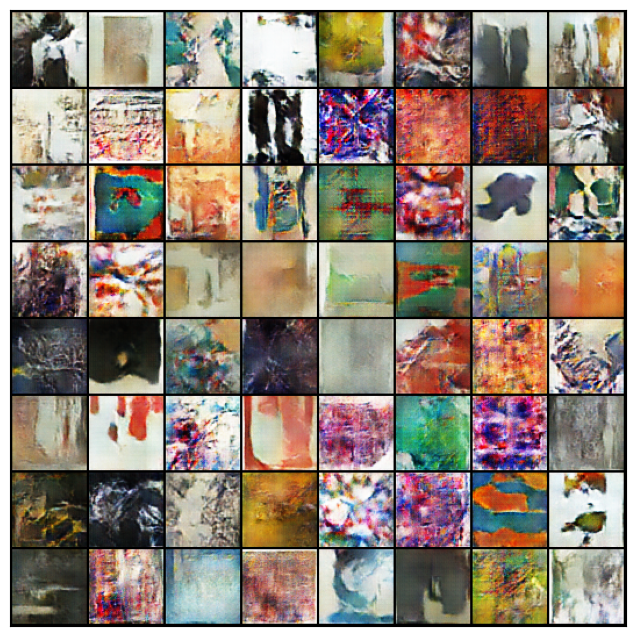


Epoch: 300


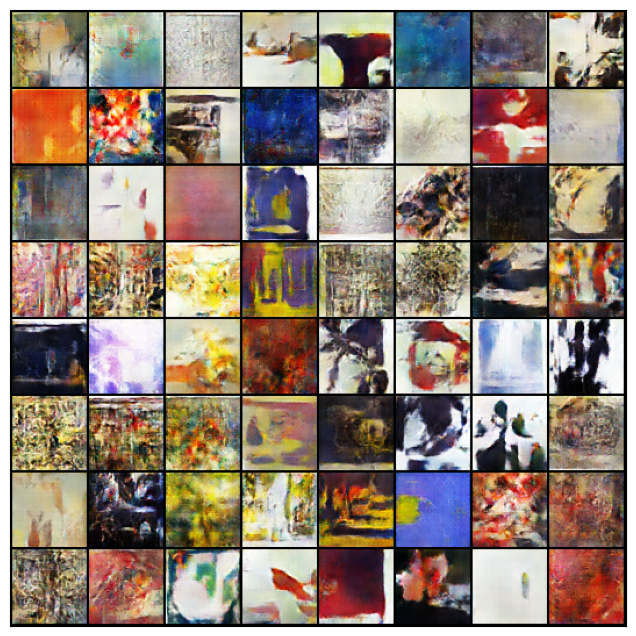


Epoch: 350


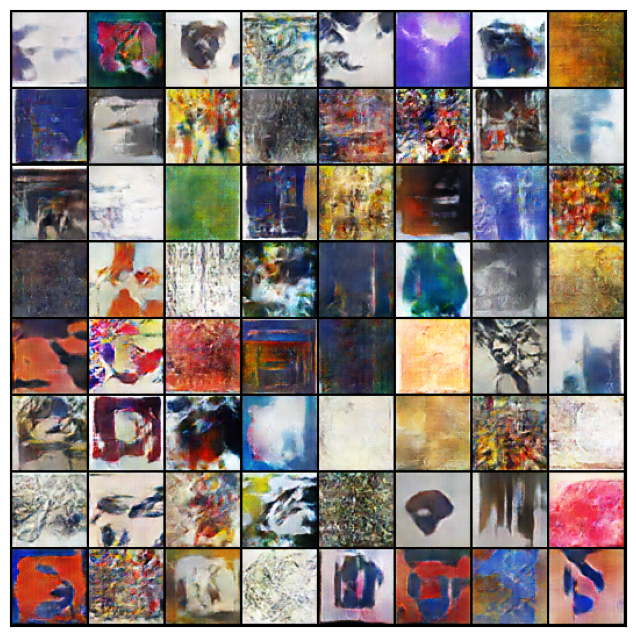


Epoch: 400


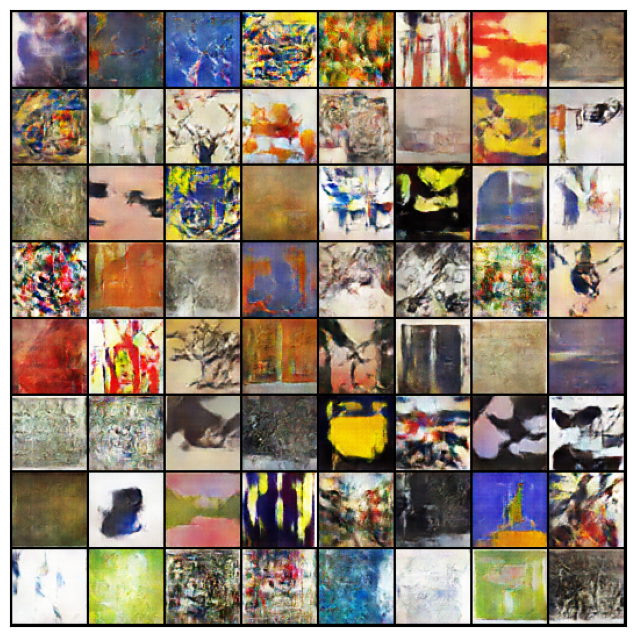


Epoch: 450


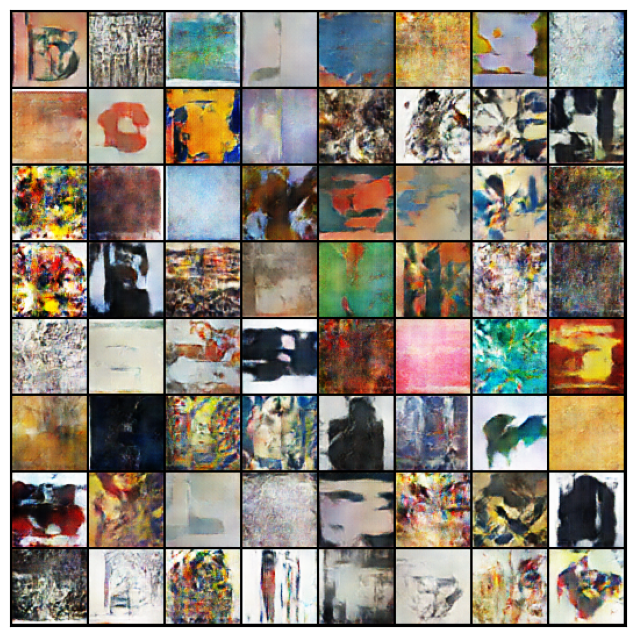

In [16]:
# Showing generated images during training
num_iter = 0
for image in epoch_images:
    print("Epoch: {}".format(num_iter))
    show_images(image)
    plt.show()
    num_iter += show_every
    print()

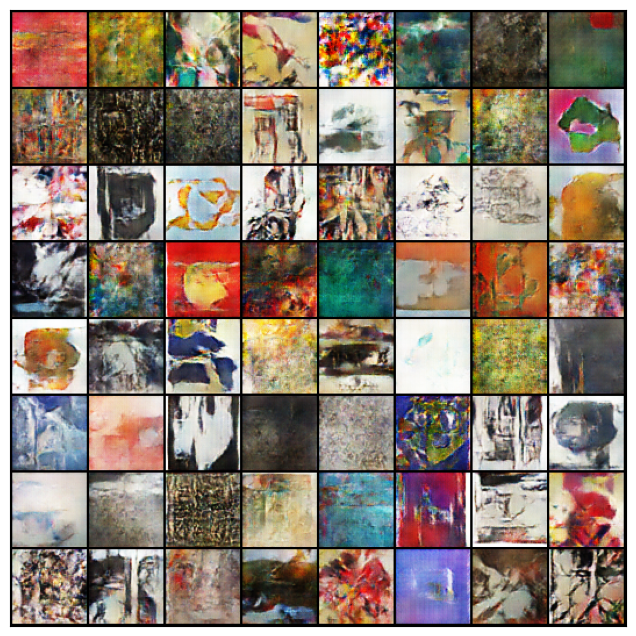

In [49]:
# Showing final learned generated images
noise = torch.randn(batch_size, noise_dim, 1, 1).type(dtype)
fake_images = generator(noise).type(dtype)
show_images(fake_images.cpu())